# Weekly Sales Forecast

__Objective__ :

- To develop a predictive model that forecasts weekly sales for various departments across retail stores.

__Goal__:

- To understand the impact and correlation of various factors (such as markdowns, temperature, store type, and holidays) on weekly sales, and to develop an accurate sales forecasting model for up 
  to 81 departments across 45 stores.

__Evaluation__:

- The model's performance will be evaluated using RMSE (Root Mean Squared Error), R² (R-squared), MAE (Mean Absolute Error) and the MAPE (Mean Absolute Percentage Error).

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from sklearn.model_selection import train_test_split, KFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import make_column_transformer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import ParameterGrid
import xgboost as xgb


In [12]:
features_url = "https://drive.google.com/file/d/1J80aXBMcYp54F759o8wg5Ud0Lo_FtK62/view?usp=sharing"
stores_url = "https://drive.google.com/file/d/1ZoGRulYebRMdjBaVsTz9KkqbngnNxn9b/view?usp=sharing"
train_url = "https://drive.google.com/file/d/1H82PVxZHJJUOiUShGWZzXK_VoB8-XKy7/view?usp=sharing"
test_url = "https://drive.google.com/file/d/1c8xCdpp48b54qzxUZmJf5mw9qcktdVD1/view?usp=sharing"


def get_direct_download_url(drive_url):
    return 'https://drive.google.com/uc?export=download&id=' + drive_url.split('/')[-2]

features = pd.read_csv(get_direct_download_url(features_url))
stores = pd.read_csv(get_direct_download_url(stores_url))
train = pd.read_csv(get_direct_download_url(train_url))
test = pd.read_csv(get_direct_download_url(test_url))


def display_dataset_info(name, dataset):
    print(f"\n{name} Dataset:")
    print(dataset.head(), "\n")
    print(f"Shape: {dataset.shape}")
    print("-" * 50)


display_dataset_info("Features", features)
display_dataset_info("Stores", stores)
display_dataset_info("Train", train)
display_dataset_info("Test", test)


Features Dataset:
   Store        Date  Temperature  Fuel_Price  MarkDown1  MarkDown2  \
0      1  2010-02-05        42.31       2.572        NaN        NaN   
1      1  2010-02-12        38.51       2.548        NaN        NaN   
2      1  2010-02-19        39.93       2.514        NaN        NaN   
3      1  2010-02-26        46.63       2.561        NaN        NaN   
4      1  2010-03-05        46.50       2.625        NaN        NaN   

   MarkDown3  MarkDown4  MarkDown5         CPI  Unemployment  IsHoliday  
0        NaN        NaN        NaN  211.096358         8.106      False  
1        NaN        NaN        NaN  211.242170         8.106       True  
2        NaN        NaN        NaN  211.289143         8.106      False  
3        NaN        NaN        NaN  211.319643         8.106      False  
4        NaN        NaN        NaN  211.350143         8.106      False   

Shape: (8190, 12)
--------------------------------------------------

Stores Dataset:
   Store Type    Size


##  Dataset

__Dataset Summary__

The datasets provided for the task of weekly sales forecasting for retail stores are as follows:

__features.csv:__

- Contains 8190 records, with information about various external factors such as temperature, fuel prices, markdowns, CPI (Consumer Price Index), and unemployment rates.

Fields include:

- Store: Store ID.
- Date: Week date.
- Temperature, Fuel_Price: External factors.
- MarkDown1 to MarkDown5: Promotional markdowns (many missing values).
- CPI, Unemployment: Economic indicators (some missing values).
- IsHoliday: Indicates whether the week includes a holiday.

__stores.csv:__

- Contains 45 records, describing the characteristics of each store.

Fields include:

- Store: Store ID.
- Type: Store type (e.g., A, B, C).
- Size: Size of the store in square footage.

__train.csv:__

Contains 421570 records of historical weekly sales data for various store departments.

Fields include:

- Store: Store ID.
- Dept: Department ID.
- Date: Week date.
- Weekly_Sales: Target variable representing sales revenue.
- IsHoliday: Indicates whether the week includes a holiday.

__test.csv:__

Contains 115064 records, with similar fields as train.csv, but without the Weekly_Sales target variable. This dataset will be used for the final predictions.

Fields include:

- Store: Store ID.
- Dept: Department ID.
- Date: Week date.
- IsHoliday: Indicates whether the week includes a holiday

## Data Exploration

In [34]:
features

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False


In [38]:
stores

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875
5,6,A,202505
6,7,B,70713
7,8,A,155078
8,9,B,125833
9,10,B,126512


In [40]:
train

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False
...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,False
421566,45,98,2012-10-05,628.10,False
421567,45,98,2012-10-12,1061.02,False
421568,45,98,2012-10-19,760.01,False


In [42]:
test

,Store,Dept,Date,IsHoliday
0,1,1,2012-11-02,False
1,1,1,2012-11-09,False
2,1,1,2012-11-16,False
3,1,1,2012-11-23,True
4,1,1,2012-11-30,False
...,...,...,...,...
115059,45,98,2013-06-28,False
115060,45,98,2013-07-05,False
115061,45,98,2013-07-12,False
115062,45,98,2013-07-19,False


In [44]:
def explore_dataset(name, dataset):
    print(f"\n{name} Dataset Overview:")
    print("-" * 50)
    print("Columns and Data Types:")
    print(dataset.dtypes)
    print("\nMissing Values:")
    print(dataset.isnull().sum())
    print("\nBasic Statistics:")
    print(dataset.describe(include='all'))
    print("-" * 50)

explore_dataset("Features", features)
explore_dataset("Stores", stores)
explore_dataset("Train", train)
explore_dataset("Test", test)


Features Dataset Overview:
--------------------------------------------------
Columns and Data Types:
Store             int64
Date             object
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemployment    float64
IsHoliday          bool
dtype: object

Missing Values:
Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

Basic Statistics:
              Store        Date  Temperature   Fuel_Price      MarkDown1  \
count   8190.000000        8190  8190.000000  8190.000000    4032.000000   
unique          NaN         182          NaN          NaN            NaN   
top             NaN  2010-02-05          NaN          NaN         

In [46]:
def check_duplicates(name, df):
    duplicate_count = df.duplicated().sum()
    print(f"{name} Dataset: {duplicate_count} duplicate rows found.")

check_duplicates("Train", train)
check_duplicates("Test", test)
check_duplicates("Features", features)
check_duplicates("Stores", stores)

Train Dataset: 0 duplicate rows found.
Test Dataset: 0 duplicate rows found.
Features Dataset: 0 duplicate rows found.
Stores Dataset: 0 duplicate rows found.


## Missing values

In [49]:
features['CPI'] = features['CPI'].fillna(features['CPI'].mean())
features['Unemployment'] = features['Unemployment'].fillna(features['Unemployment'].mean())

features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [51]:
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
features[markdown_columns] = features[markdown_columns].fillna(0)

features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,False


## Merge

In [17]:
train_features = pd.merge(train, features, on=['Store', 'Date'], how='left')

train_merged = pd.merge(train_features, stores, on='Store', how='left')

print("Merged Train Dataset:")
print(train_merged.head())
print("Shape:", train_merged.shape)

Merged Train Dataset:
   Store  Dept        Date  Weekly_Sales  IsHoliday_x  Temperature  \
0      1     1  2010-02-05      24924.50        False        42.31   
1      1     1  2010-02-12      46039.49         True        38.51   
2      1     1  2010-02-19      41595.55        False        39.93   
3      1     1  2010-02-26      19403.54        False        46.63   
4      1     1  2010-03-05      21827.90        False        46.50   

   Fuel_Price  MarkDown1  MarkDown2  MarkDown3  MarkDown4  MarkDown5  \
0       2.572        NaN        NaN        NaN        NaN        NaN   
1       2.548        NaN        NaN        NaN        NaN        NaN   
2       2.514        NaN        NaN        NaN        NaN        NaN   
3       2.561        NaN        NaN        NaN        NaN        NaN   
4       2.625        NaN        NaN        NaN        NaN        NaN   

          CPI  Unemployment  IsHoliday_y Type    Size  
0  211.096358         8.106        False    A  151315  
1  211.24217

In [19]:
train_merged = train_merged.drop(columns=['IsHoliday_y'])
train_merged.rename(columns={'IsHoliday_x': 'IsHoliday'}, inplace=True)

In [21]:
train_merged['Date'] = pd.to_datetime(train_merged['Date'])

## Negative values in Weekly_Sales and MarkDown columns

In [60]:
negative_sales = train_merged[train_merged['Weekly_Sales'] < 0]
print("\nRows with Negative Weekly_Sales:")
print(negative_sales)

for col in markdown_columns:
    print(f"\nNumber of Negative Values in {col}: {train_merged[train_merged[col] < 0].shape[0]}")



Rows with Negative Weekly_Sales:
        Store  Dept        Date  Weekly_Sales  IsHoliday_x  Temperature  \
846         1     6  2012-08-10       -139.65        False        85.05   
2384        1    18  2012-05-04         -1.27        False        75.55   
6048        1    47  2010-02-19       -863.00        False        39.93   
6049        1    47  2010-03-12       -698.00        False        57.79   
6051        1    47  2010-10-08        -58.00        False        63.93   
...       ...   ...         ...           ...          ...          ...   
419597     45    80  2010-02-12         -0.43         True        27.73   
419598     45    80  2010-02-19         -0.27        False        31.27   
419603     45    80  2010-04-16         -1.61        False        54.28   
419614     45    80  2010-07-02         -0.27        False        76.61   
419640     45    80  2011-02-11         -0.24         True        30.30   

        Fuel_Price  MarkDown1  MarkDown2  MarkDown3  MarkDown4  M

In [23]:
train_merged = train_merged[train_merged['Weekly_Sales'] >= 0]

markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
for col in markdown_columns:
    train_merged[col] = train_merged[col].apply(lambda x: max(x, 0))

print("\nUpdated Dataset:")
print(train_merged.head())


Updated Dataset:
   Store  Dept       Date  Weekly_Sales  IsHoliday  Temperature  Fuel_Price  \
0      1     1 2010-02-05      24924.50      False        42.31       2.572   
1      1     1 2010-02-12      46039.49       True        38.51       2.548   
2      1     1 2010-02-19      41595.55      False        39.93       2.514   
3      1     1 2010-02-26      19403.54      False        46.63       2.561   
4      1     1 2010-03-05      21827.90      False        46.50       2.625   

   MarkDown1  MarkDown2  MarkDown3  MarkDown4  MarkDown5         CPI  \
0        NaN        NaN        NaN        NaN        NaN  211.096358   
1        NaN        NaN        NaN        NaN        NaN  211.242170   
2        NaN        NaN        NaN        NaN        NaN  211.289143   
3        NaN        NaN        NaN        NaN        NaN  211.319643   
4        NaN        NaN        NaN        NaN        NaN  211.350143   

   Unemployment Type    Size  
0         8.106    A  151315  
1         8.

In [78]:
negative_sales_count = train_merged[train_merged['Weekly_Sales'] < 0].shape[0]
print(f"Number of rows with negative Weekly_Sales: {negative_sales_count}")

markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
for col in markdown_columns:
    negative_markdown_count = train_merged[train_merged[col] < 0].shape[0]
    print(f"Number of negative values in {col}: {negative_markdown_count}")

Number of rows with negative Weekly_Sales: 0
Number of negative values in MarkDown1: 0
Number of negative values in MarkDown2: 0
Number of negative values in MarkDown3: 0
Number of negative values in MarkDown4: 0
Number of negative values in MarkDown5: 0


## low Weekly_Sales < 10

In [81]:
anomalous_sales = train_merged[train_merged['Weekly_Sales'] < 10]

print(f"Number of rows with Weekly_Sales < 10: {anomalous_sales.shape[0]}")

anomalous_sales[['Store', 'Dept', 'Date', 'Weekly_Sales']].head(20)

Number of rows with Weekly_Sales < 10: 5442


,Store,Dept,Date,Weekly_Sales
2300,1,18,2010-05-14,0.50
2301,1,18,2010-06-04,4.10
2302,1,18,2010-06-11,0.15
2303,1,18,2010-08-20,1.00
2331,1,18,2011-03-04,2.75
2332,1,18,2011-03-11,3.10
2342,1,18,2011-05-20,1.80
2343,1,18,2011-05-27,0.35
2344,1,18,2011-06-10,1.00
2345,1,18,2011-06-17,2.00


## Mean and median sales


In [84]:
mean_sales = train['Weekly_Sales'].mean()
median_sales = train['Weekly_Sales'].median()
print(f"Mean Sales: {mean_sales}, Median Sales: {median_sales}")

Mean Sales: 15981.25812346704, Median Sales: 7612.03


## Distribution of Weekly Sales

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=train_merged['Weekly_Sales'],
    nbinsx=50,
    marker=dict(color='skyblue', line=dict(color='black', width=1))
))

fig.update_layout(
    title="Distribution of Weekly Sales",
    xaxis_title="Weekly Sales",
    yaxis_title="Frequency",
    template="plotly_dark",  # Black background
    plot_bgcolor='black',  # Black background for the plot
    paper_bgcolor='black'  # Black background for the entire figure
)

fig.show()

## Optimal threshold

In [90]:
thresholds = [10, 20, 30, 50, 75]
params = {'threshold': thresholds}
best_rmse = float('inf')
best_threshold = 50

In [92]:
initial_count = train.shape[0]
train = train[train['Weekly_Sales'] >= 50].copy()
filtered_count = train.shape[0]
print(f"Rows removed: {initial_count - filtered_count} due to threshold W_S >=50")
print(f"Remaining rows: {filtered_count}")

Rows removed: 19130 due to threshold W_S >=50
Remaining rows: 402440


## Exploratory Data Analysis

## Time Series of Weekly Sales

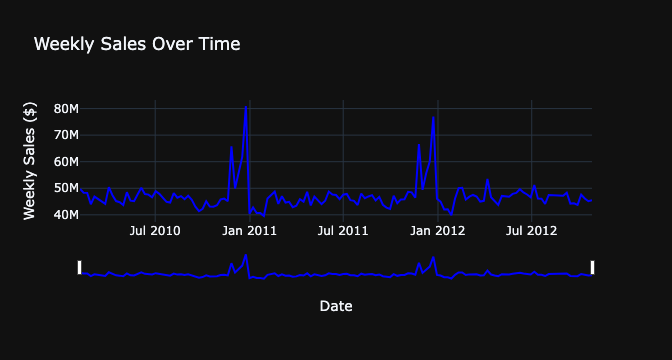

In [27]:
sales_trends = train_merged.groupby('Date')['Weekly_Sales'].sum()

fig = go.Figure()

fig.add_trace(go.Scatter(x=sales_trends.index, y=sales_trends.values, mode='lines', name='Weekly Sales', line=dict(color='blue')))

fig.update_layout(
    title="Weekly Sales Over Time",
    xaxis_title="Date",
    yaxis_title="Weekly Sales ($)",
    template="plotly_dark",
    xaxis_rangeslider_visible=True,
)

fig.show()

## Boxplot of Weekly Sales Distribution (to spot outliers)

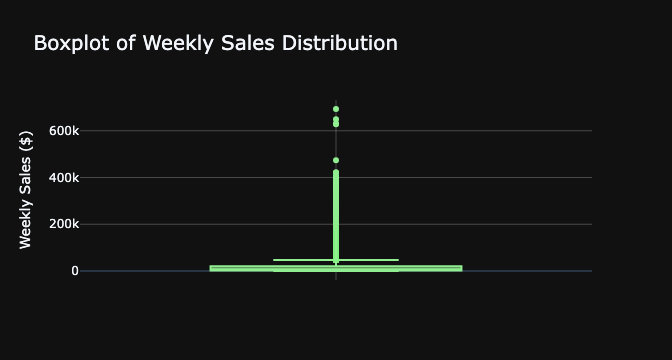

In [171]:
fig = px.box(
    train_merged, 
    y='Weekly_Sales',
    title='Boxplot of Weekly Sales Distribution',
    labels={'Weekly_Sales': 'Weekly Sales ($)'},
    color_discrete_sequence=['lightgreen']
)

fig.update_layout(
    template='plotly_dark',  # Set background to black
    title_font_size=20,
    xaxis=dict(
        title="",
        showgrid=True,
        gridwidth=0.5,
        gridcolor='gray'
    ),
    yaxis=dict(
        title="Weekly Sales ($)",
        showgrid=True,
        gridwidth=0.5,
        gridcolor='gray'
    )
)

fig.show()


## Sales by Store Type (A, B, C)

In [ ]:
fig = px.box(
    train_merged,
    x='Type',
    y='Weekly_Sales',
    title='Sales Distribution by Store Type',
    labels={'Type': 'Store Type', 'Weekly_Sales': 'Weekly Sales ($)'},
    color='Type',
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_layout(
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    font_color='white'
)

fig.show()


In [108]:
store_size_range = train_merged.groupby('Type')['Size'].agg(['min', 'max'])

print(store_size_range)

        min     max
Type               
A     39690  219622
B     34875  140167
C     39690   42988


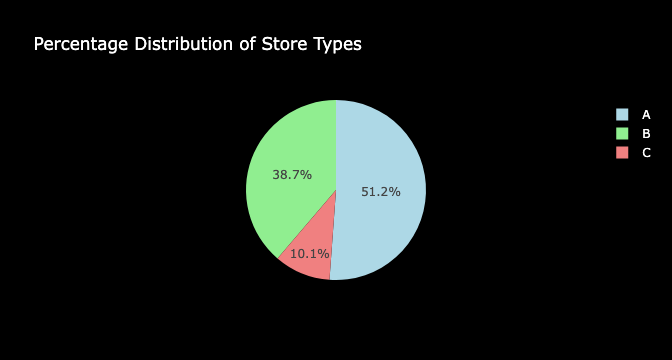

In [157]:
store_type_percentage = train_merged['Type'].value_counts(normalize=True) * 100

fig = px.pie(
    values=store_type_percentage,
    names=store_type_percentage.index,
    title='Percentage Distribution of Store Types',
    labels={'names': 'Store Type', 'values': 'Percentage'},
    color=store_type_percentage.index,
    color_discrete_map={'A': 'lightblue', 'B': 'lightgreen', 'C': 'lightcoral'}
)

fig.update_layout(
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    font_color='white'
)

fig.show()


## Weekly Sales per Store

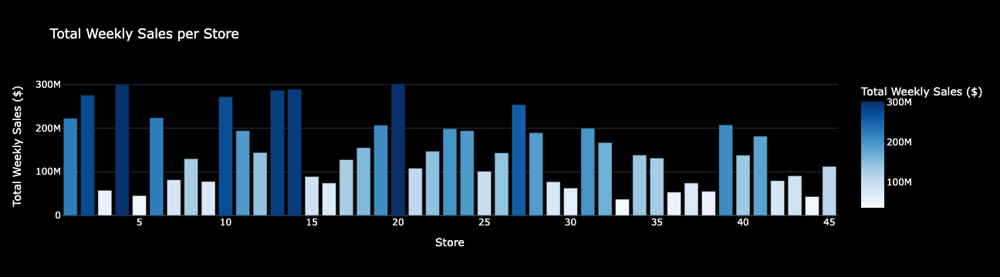

In [155]:
sales_per_store = train_merged.groupby('Store')['Weekly_Sales'].sum().reset_index()

fig = px.bar(
    sales_per_store,
    x='Store',
    y='Weekly_Sales',
    title='Total Weekly Sales per Store',
    labels={'Store': 'Store', 'Weekly_Sales': 'Total Weekly Sales ($)'},
    color='Weekly_Sales',
    color_continuous_scale='Blues'
)

fig.update_layout(
    xaxis_title='Store',
    yaxis_title='Total Weekly Sales ($)',
    template='plotly_dark',
    plot_bgcolor='black',
    paper_bgcolor='black',
    font_color='white'
)

fig.show()


## Sales by department

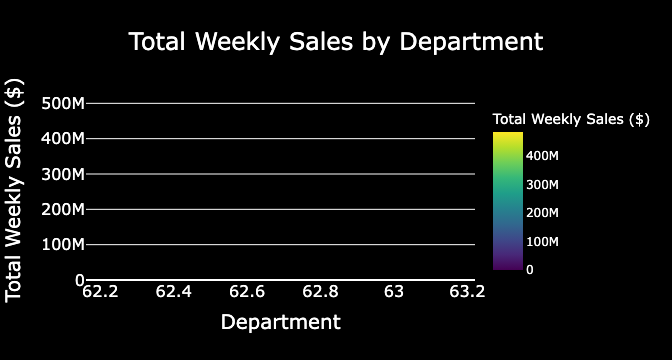

In [39]:

# Group and sort the data by department
sales_by_dept = train_merged.groupby('Dept')['Weekly_Sales'].sum().reset_index()
sales_by_dept = sales_by_dept.sort_values('Weekly_Sales', ascending=False)

# Create the bar plot
fig = px.bar(
    sales_by_dept,
    x='Dept',
    y='Weekly_Sales',
    title='Total Weekly Sales by Department',
    labels={'Dept': 'Department', 'Weekly_Sales': 'Total Weekly Sales ($)'},
    color='Weekly_Sales',
    color_continuous_scale='viridis'
)

# Remove the color bar
fig.update_layout(coloraxis_showscale=False)

# Show the plot
fig.show()


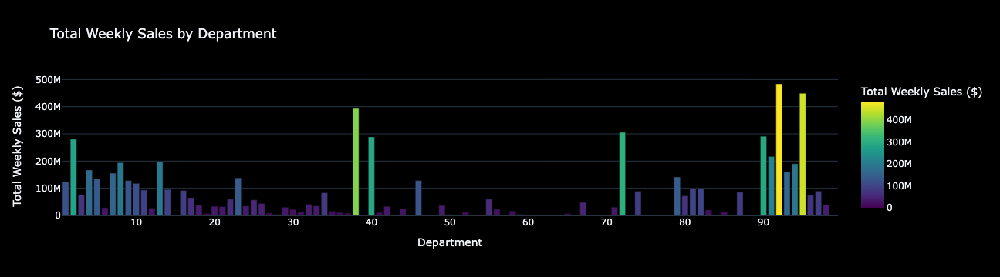

In [153]:
sales_by_dept = train_merged.groupby('Dept')['Weekly_Sales'].sum().reset_index()

sales_by_dept = sales_by_dept.sort_values('Weekly_Sales', ascending=False)

fig = px.bar(
    sales_by_dept,
    x='Dept',
    y='Weekly_Sales',
    title='Total Weekly Sales by Department',
    labels={'Dept': 'Department', 'Weekly_Sales': 'Total Weekly Sales ($)'},
    color='Weekly_Sales',
    color_continuous_scale='viridis'
)

fig.show()


## Correlation Heatmap

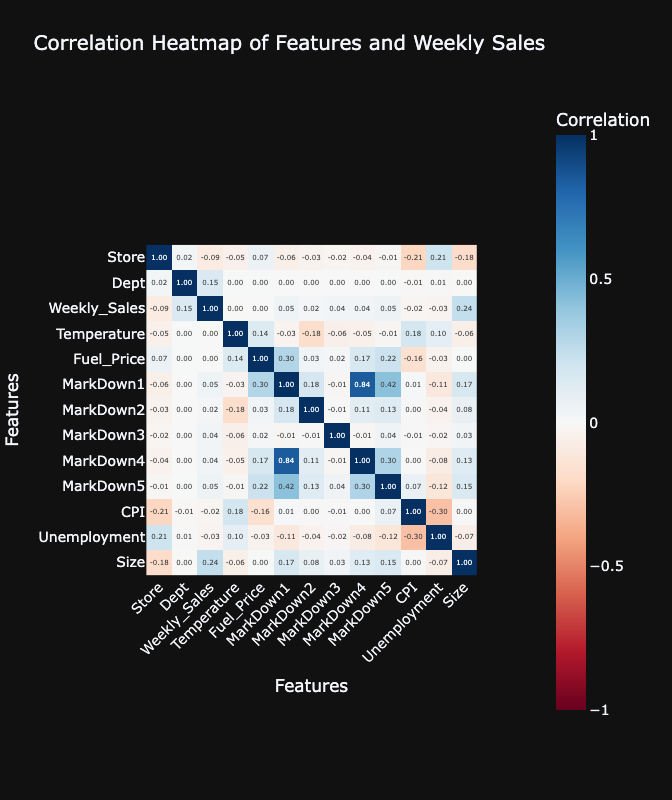

In [125]:
numeric_columns = train_merged.select_dtypes(include=['number']).columns
correlation_matrix = train_merged[numeric_columns].corr()


fig = px.imshow(
    correlation_matrix,
    text_auto=".2f",
    color_continuous_scale="RdBu",  
    zmin=-1, zmax=1,
    labels=dict(color="Correlation"),
    title="Correlation Heatmap of Features and Weekly Sales"
)


fig.update_layout(
    title_font_size=20,
    font=dict(size=14),
    autosize=False,
    width=1000,  
    xaxis=dict(title="Features", tickangle=-45),
    yaxis=dict(title="Features"),
    template="plotly_dark",  
)

fig.show()


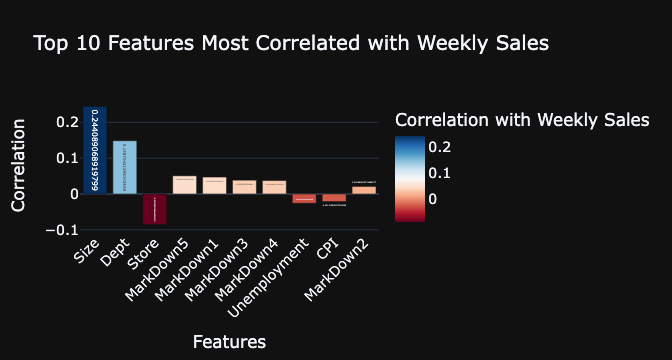

In [129]:
numeric_columns = train_merged.select_dtypes(include=['number']).columns
correlation_matrix = train_merged[numeric_columns].corr()
correlations = correlation_matrix['Weekly_Sales'].sort_values(key=abs, ascending=False)
top_10_correlations = correlations[1:11]

top_10_df = pd.DataFrame({
    'Feature': top_10_correlations.index,
    'Correlation': top_10_correlations.values
})

fig = px.bar(
    top_10_df,
    x='Feature',
    y='Correlation',
    title="Top 10 Features Most Correlated with Weekly Sales",
    text='Correlation',
    labels={'Correlation': 'Correlation with Weekly Sales', 'Feature': 'Features'},
    color='Correlation',
    color_continuous_scale='RdBu'
)

fig.update_layout(
    title_font_size=20,
    font=dict(size=14),
    template="plotly_dark",
    xaxis=dict(title="Features", tickangle=-45),
    yaxis=dict(title="Correlation"),
)

fig.show()


## Sales comparison by holiday vs non-holiday

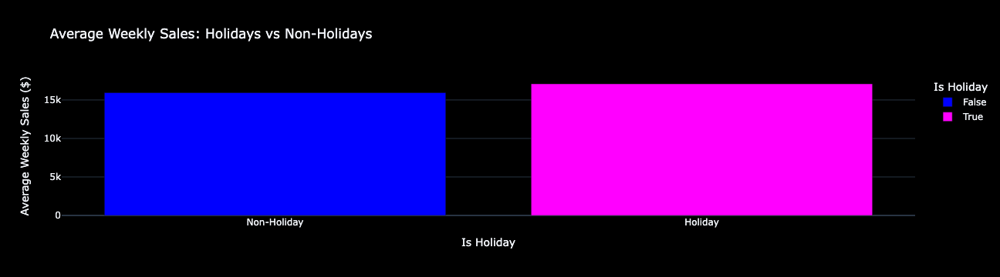

In [151]:
pio.templates["custom_dark"] = pio.templates["plotly_dark"]
pio.templates["custom_dark"].layout.paper_bgcolor = "black"
pio.templates["custom_dark"].layout.plot_bgcolor = "black"
pio.templates.default = "custom_dark"

holiday_sales = train_merged.groupby('IsHoliday')['Weekly_Sales'].mean().reset_index()

fig = px.bar(
    holiday_sales,
    x='IsHoliday',
    y='Weekly_Sales',
    title='Average Weekly Sales: Holidays vs Non-Holidays',
    labels={'IsHoliday': 'Is Holiday', 'Weekly_Sales': 'Average Weekly Sales ($)'},
    color='IsHoliday',
    color_discrete_map={0: 'blue', 1: 'magenta'}
)

fig.update_xaxes(tickmode='array', tickvals=[0, 1], ticktext=['Non-Holiday', 'Holiday'])
fig.show()


## Weekly_Sales on Holidays

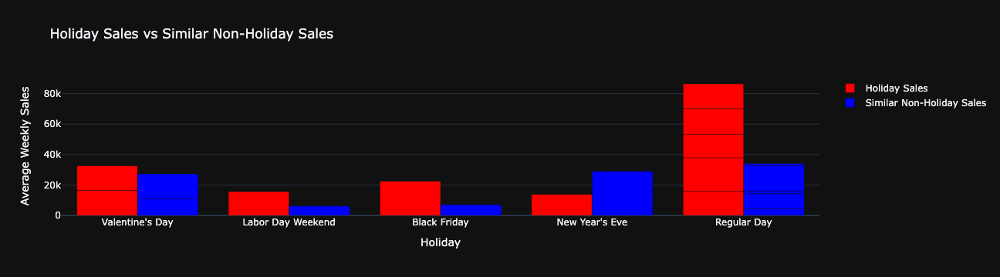

In [139]:
train_merged['DayOfWeek'] = train_merged['Date'].dt.dayofweek

holiday_sales = train_merged[train_merged['IsHoliday'] == 1]
non_holiday_sales = train_merged[train_merged['IsHoliday'] == 0]

selected_holidays = holiday_sales['Date'].unique()

holiday_comparison_data = []
for holiday_date in selected_holidays:
    holiday_day_of_week = holiday_sales[holiday_sales['Date'] == holiday_date]['DayOfWeek'].values[0]
    similar_non_holiday = non_holiday_sales[non_holiday_sales['DayOfWeek'] == holiday_day_of_week].sample(1)
    holiday_comparison_data.append({
        'Holiday': holiday_sales[holiday_sales['Date'] == holiday_date]['Holiday_Description'].values[0],
        'Holiday_Sales': holiday_sales[holiday_sales['Date'] == holiday_date]['Weekly_Sales'].mean(),
        'Non_Holiday_Sales': similar_non_holiday['Weekly_Sales'].mean(),
        'Holiday_Date': holiday_date,
        'Similar_Non_Holiday_Date': similar_non_holiday['Date'].values[0]
    })

holiday_comparison_df = pd.DataFrame(holiday_comparison_data)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=holiday_comparison_df['Holiday'],
    y=holiday_comparison_df['Holiday_Sales'],
    name='Holiday Sales',
    marker_color='red'
))

fig.add_trace(go.Bar(
    x=holiday_comparison_df['Holiday'],
    y=holiday_comparison_df['Non_Holiday_Sales'],
    name='Similar Non-Holiday Sales',
    marker_color='blue'
))

fig.update_layout(
    title='Holiday Sales vs Similar Non-Holiday Sales',
    xaxis=dict(title='Holiday'),
    yaxis=dict(title='Average Weekly Sales'),
    barmode='group',
    template='plotly_dark'
)

fig.show()


Weekly Sales during Holidays vs Non-Holidays

In [147]:
if 'Week' not in train_merged.columns:
    train_merged['Week'] = train_merged['Date'].dt.isocalendar().week

train_merged['IsHolidayWeek'] = train_merged['IsHoliday']

weekly_sales = train_merged.groupby(['Week', 'IsHolidayWeek'])['Weekly_Sales'].mean().reset_index()

holi_wk_sales_no = weekly_sales[weekly_sales['IsHolidayWeek'] == 0].set_index('Week')['Weekly_Sales']
holi_wk_sales_yes = weekly_sales[weekly_sales['IsHolidayWeek'] == 1].set_index('Week')['Weekly_Sales']


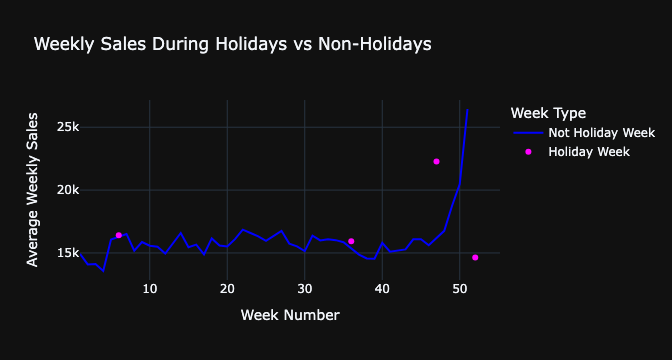

In [149]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=holi_wk_sales_no.index,
    y=holi_wk_sales_no.values,
    mode='lines',
    name="Not Holiday Week",
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=holi_wk_sales_yes.index,
    y=holi_wk_sales_yes.values,
    mode='markers',
    name="Holiday Week",
    marker=dict(color='magenta')
))

fig.update_layout(
    title='Weekly Sales During Holidays vs Non-Holidays',
    xaxis_title='Week Number',
    yaxis_title='Average Weekly Sales',
    legend_title='Week Type',
    template='plotly_dark' 
)

fig.show()


## Markdowns vs Sales

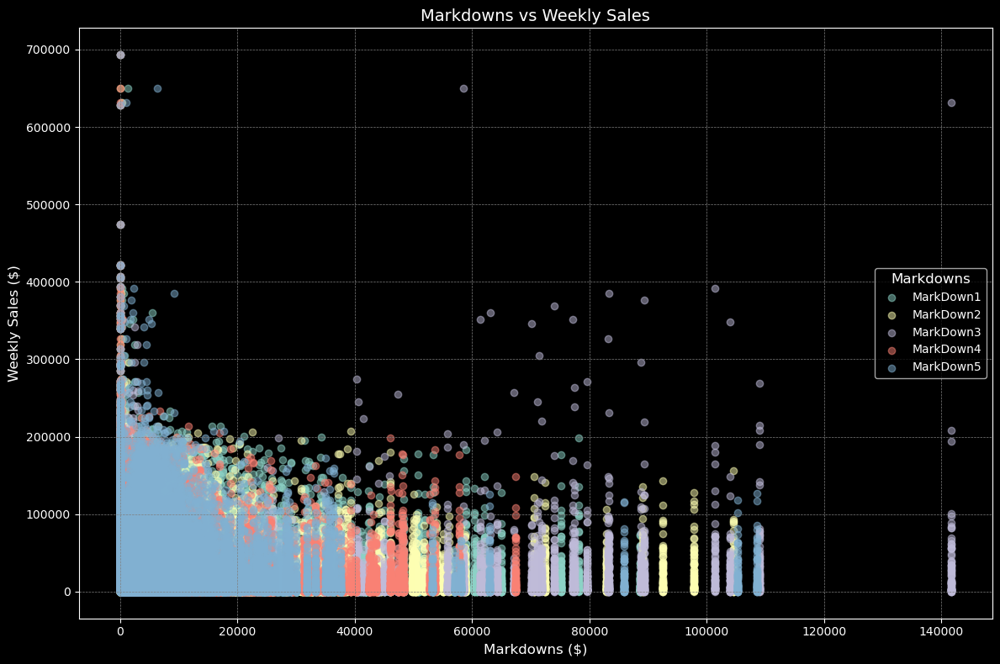

In [166]:
plt.style.use('dark_background')
plt.figure(figsize=(12, 8))

for col in ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']:
    plt.scatter(train_merged[col], train_merged['Weekly_Sales'], alpha=0.5, label=col)

plt.title('Markdowns vs Weekly Sales', fontsize=14, color='white')
plt.xlabel('Markdowns ($)', fontsize=12, color='white')
plt.ylabel('Weekly Sales ($)', fontsize=12, color='white')
plt.legend(title='Markdowns', fontsize=10, title_fontsize=12)
plt.grid(color='gray', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()


## Sales During Different Weeks

In [174]:
train_merged['Year'] = train_merged['Date'].dt.year
train_merged['Week'] = train_merged['Date'].dt.isocalendar().week

weekly_sales_2010 = train_merged[train_merged['Year'] == 2010].groupby('Week')['Weekly_Sales'].mean()
weekly_sales_2011 = train_merged[train_merged['Year'] == 2011].groupby('Week')['Weekly_Sales'].mean()
weekly_sales_2012 = train_merged[train_merged['Year'] == 2012].groupby('Week')['Weekly_Sales'].mean()

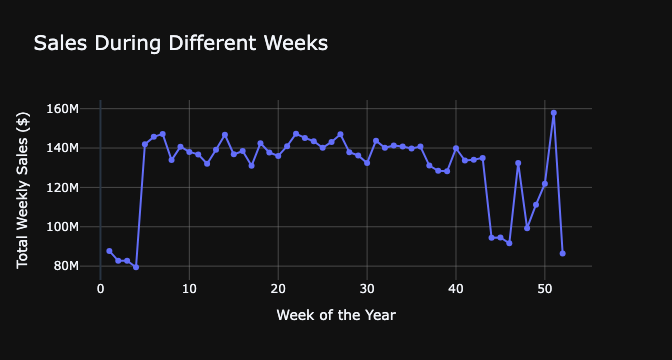

In [178]:
import plotly.express as px

weekly_sales = train_merged.groupby('Week')['Weekly_Sales'].sum().reset_index()

fig = px.line(
    weekly_sales,
    x='Week',
    y='Weekly_Sales',
    title='Sales During Different Weeks',
    labels={'Week': 'Week of the Year', 'Weekly_Sales': 'Total Weekly Sales ($)'},
    markers=True
)

fig.update_layout(
    template='plotly_dark',
    title_font_size=20,
    xaxis=dict(
        title="Week of the Year",
        showgrid=True,
        gridwidth=0.5,
        gridcolor='gray'
    ),
    yaxis=dict(
        title="Total Weekly Sales ($)",
        showgrid=True,
        gridwidth=0.5,
        gridcolor='gray'
    )
)

fig.show()


## Store Size vs Sales

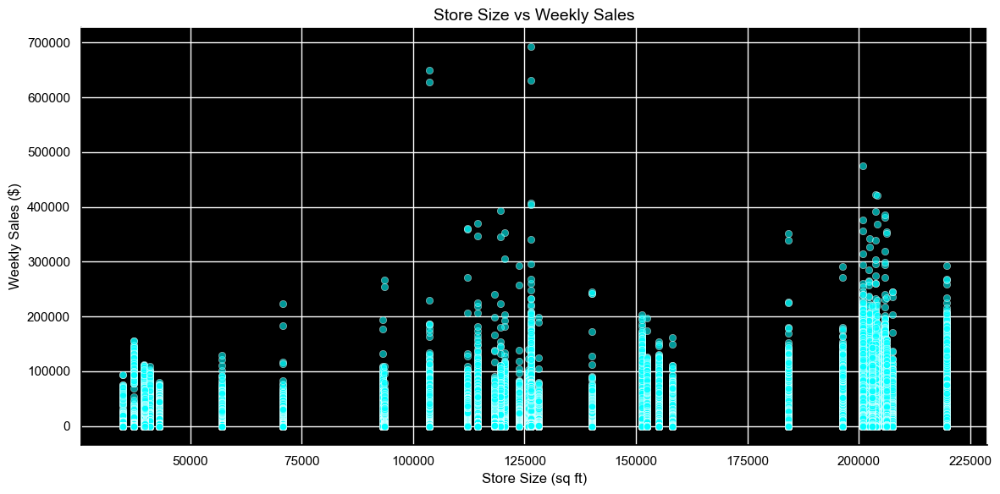

In [193]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="darkgrid")  # Set background to black

plt.figure(figsize=(12, 6))
plt.style.use("dark_background")  # Apply dark background
sns.scatterplot(data=train_merged, x='Size', y='Weekly_Sales', color='cyan', alpha=0.6)

plt.title('Store Size vs Weekly Sales', fontsize=14, color='black')
plt.xlabel('Store Size (sq ft)', fontsize=12, color='black')
plt.ylabel('Weekly Sales ($)', fontsize=12, color='black')

plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['left'].set_color('black')
plt.gca().tick_params(colors='black')

plt.tight_layout()
plt.show()


## Average Weekly Sales per Year

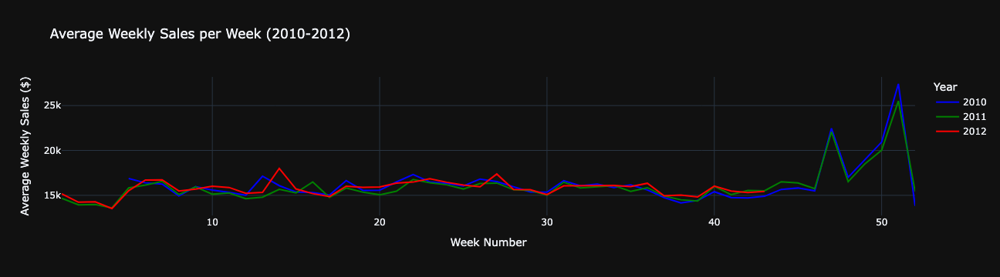

In [196]:
wk_sales_2010 = train_merged[train_merged['Year'] == 2010].groupby('Week')['Weekly_Sales'].mean()
wk_sales_2011 = train_merged[train_merged['Year'] == 2011].groupby('Week')['Weekly_Sales'].mean()
wk_sales_2012 = train_merged[train_merged['Year'] == 2012].groupby('Week')['Weekly_Sales'].mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=wk_sales_2010.index,
    y=wk_sales_2010.values,
    mode='lines',
    name='2010',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=wk_sales_2011.index,
    y=wk_sales_2011.values,
    mode='lines',
    name='2011',
    line=dict(color='green')
))

fig.add_trace(go.Scatter(
    x=wk_sales_2012.index,
    y=wk_sales_2012.values,
    mode='lines',
    name='2012',
    line=dict(color='red')
))

fig.update_layout(
    title='Average Weekly Sales per Week (2010-2012)',
    xaxis_title='Week Number',
    yaxis_title='Average Weekly Sales ($)',
    legend_title='Year',
    template='plotly_dark'
)

fig.show()


## Outliers

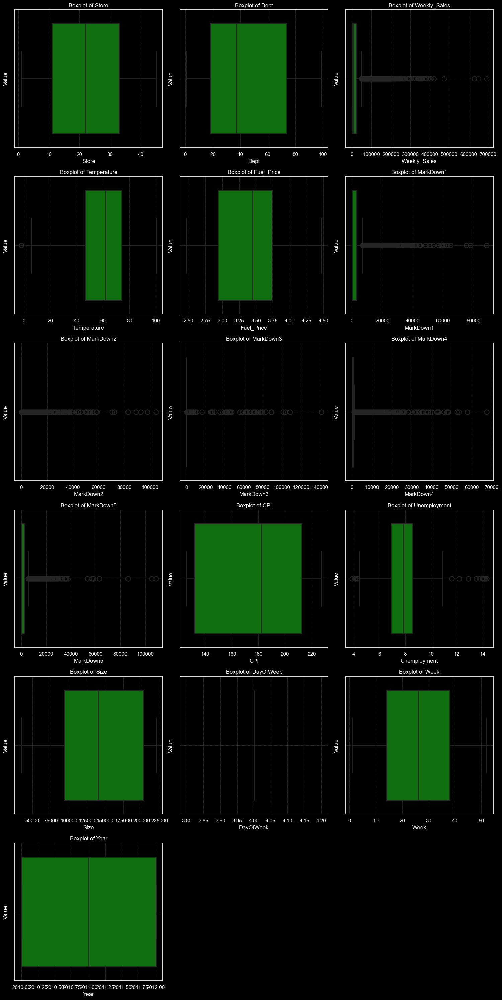

In [215]:
numeric_columns = train_merged.select_dtypes(include=['number']).columns

num_features = len(numeric_columns)
ncols = 3
nrows = np.ceil(num_features / ncols).astype(int)

plt.figure(figsize=(ncols * 5, nrows * 5), facecolor='black')

for i, col in enumerate(numeric_columns, 1):
    plt.subplot(nrows, ncols, i, facecolor='black')
    sns.boxplot(
        x=train_merged[col],
        color='green',
        linewidth=2,  
        flierprops=dict(marker='o', color='red', markersize=10, alpha=1)  
    )
    plt.title(f'Boxplot of {col}', color='white')
    plt.xlabel(col, color='white')
    plt.ylabel('Value', color='white')
    plt.xticks(color='white')
    plt.yticks(color='white')
    plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.5) 

plt.tight_layout()
plt.show()


## Model Selection and Trainig

In [313]:
train_merged['Date'] = pd.to_datetime(train_merged['Date'])

In [311]:
train_features = pd.merge(train, features, on=['Store', 'Date'], how='left')
train_merged = pd.merge(train_features, stores, on='Store', how='left')
train_merged.rename(columns={'IsHoliday_x': 'IsHoliday'}, inplace=True)

## Feature Engineering

In [315]:
train_merged['Year'] = train_merged['Date'].dt.year
train_merged['Month'] = train_merged['Date'].dt.month
train_merged['Week'] = train_merged['Date'].dt.isocalendar().week
train_merged['DayOfWeek'] = train_merged['Date'].dt.dayofweek

train_merged = train_merged.sort_values(['Store', 'Dept', 'Date'])
train_merged['Lag_1_Week'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(1)
train_merged['Lag_2_Weeks'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(2)

train_merged['IsHoliday'] = train_merged['IsHoliday'].astype(int)
train_merged['Holiday_Impact'] = train_merged['IsHoliday'] * train_merged['Weekly_Sales']

store_avg_sales = train_merged.groupby('Store')['Weekly_Sales'].transform('mean')
dept_avg_sales = train_merged.groupby('Dept')['Weekly_Sales'].transform('mean')
train_merged['Store_Avg_Sales'] = store_avg_sales
train_merged['Dept_Avg_Sales'] = dept_avg_sales

train_merged['Lag_1_Week'] = train_merged['Lag_1_Week'].fillna(0)
train_merged['Lag_2_Weeks'] = train_merged['Lag_2_Weeks'].fillna(0)


In [317]:
X = train_merged.drop(columns=['Weekly_Sales', 'Date'])
y = train_merged['Weekly_Sales']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_cat = X_train.select_dtypes(exclude='number').columns
X_num = X_train.select_dtypes(include='number').columns

preprocessor = make_column_transformer(
    (OrdinalEncoder(), X_cat),
    (SimpleImputer(strategy='mean'), X_num),
    remainder="passthrough"
)

X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

In [229]:
xgb_model = xgb.XGBRegressor(
    n_estimators=5000,
    learning_rate=0.05,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='mae',
    early_stopping_rounds=200
)

xgb_model.fit(
    X_train_transformed, y_train,
    eval_set=[(X_train_transformed, y_train), (X_test_transformed, y_test)],
    verbose=1000
)
y_train_pred = xgb_model.predict(X_train_transformed)
y_test_pred = xgb_model.predict(X_test_transformed)

[0]	validation_0-mae:14646.52600	validation_1-mae:14668.16939
[1000]	validation_0-mae:1033.88310	validation_1-mae:1310.29289
[2000]	validation_0-mae:820.96804	validation_1-mae:1236.59594
[3000]	validation_0-mae:693.05552	validation_1-mae:1208.32215
[4000]	validation_0-mae:600.08036	validation_1-mae:1193.05737
[4999]	validation_0-mae:528.46403	validation_1-mae:1183.89541


In [231]:
def calculate_mape(y_true, y_pred):
    """
    Calculate Mean Absolute Percentage Error (MAPE).

    Parameters:
    - y_true: np.ndarray or pd.Series, actual target values
    - y_pred: np.ndarray or pd.Series, predicted values

    Returns:
    - MAPE: float, Mean Absolute Percentage Error in percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0  # Avoid division by zero
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100


rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
mape_train = calculate_mape(y_train, y_train_pred)

rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mape_test = calculate_mape(y_test, y_test_pred)

print("\n--- Training Metrics ---")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train MAE: {mae_train:.4f}")
print(f"Train R²: {r2_train:.4f}")
print(f"Train MAPE: {mape_train:.2f}%")

print("\n--- Testing Metrics ---")
print(f"Test RMSE: {rmse_test:.4f}")
print(f"Test MAE: {mae_test:.4f}")
print(f"Test R²: {r2_test:.4f}")
print(f"Test MAPE: {mape_test:.2f}%")



--- Training Metrics ---
Train RMSE: 787.4283
Train MAE: 528.4640
Train R²: 0.9988
Train MAPE: 16.25%

--- Testing Metrics ---
Test RMSE: 2884.3163
Test MAE: 1183.8954
Test R²: 0.9841
Test MAPE: 23.29%


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [235]:
train_results_df = pd.DataFrame({
    "Actual_Weekly_Sales": y_train.values,
    "Predicted_Weekly_Sales": y_train_pred
})

test_results_df = pd.DataFrame({
    "Actual_Weekly_Sales": y_test.values,
    "Predicted_Weekly_Sales": y_test_pred
})

print("Training Results:")
print(train_results_df)

print("\nTest Results:")
print(test_results_df)

Training Results:
        Actual_Weekly_Sales  Predicted_Weekly_Sales
0                   4018.27             3833.756836
1                    393.82              215.495239
2                   7351.84             7624.937988
3                  11985.84            11594.531250
4                  33667.20            34558.425781
...                     ...                     ...
321947             10078.31            10179.830078
321948             11557.43            11349.715820
321949              9098.39             8084.885742
321950              5868.77             6227.394531
321951              8260.83             8338.271484

[321952 rows x 2 columns]

Test Results:
       Actual_Weekly_Sales  Predicted_Weekly_Sales
0                   640.95              724.047119
1                  8503.31            10164.188477
2                  4599.03             4706.520020
3                151391.82           153464.906250
4                   159.62              242.361374
...       

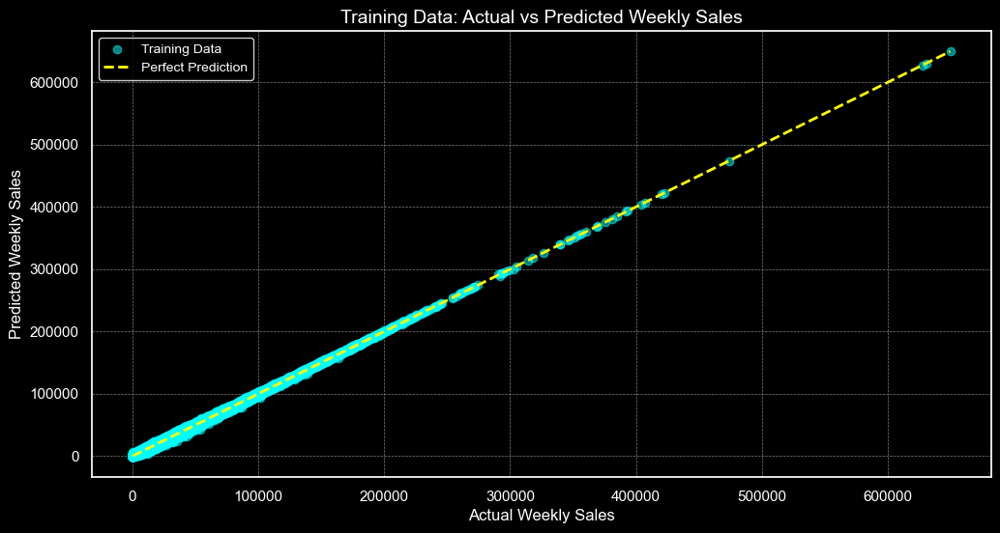

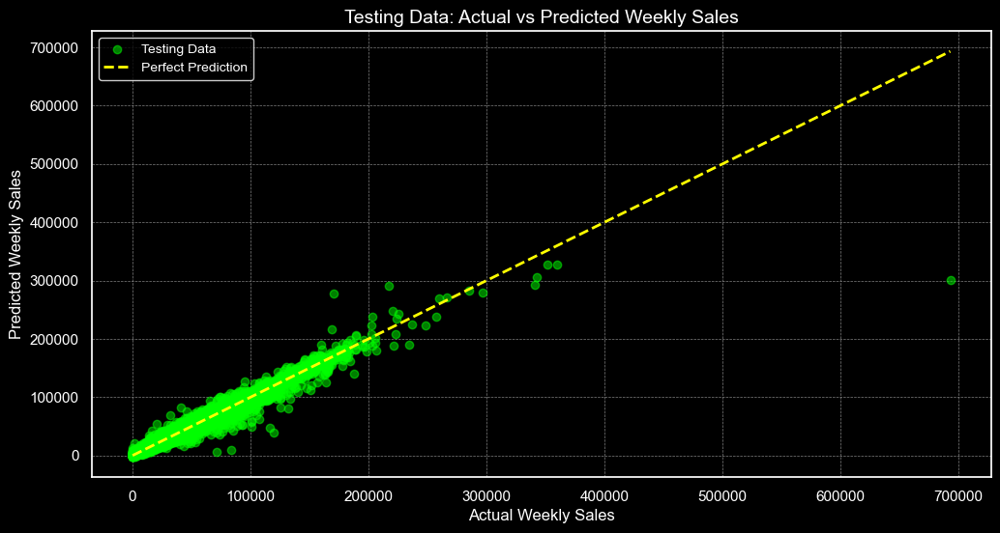

In [237]:
plt.figure(figsize=(12, 6), facecolor="black")
plt.scatter(
    train_results_df["Actual_Weekly_Sales"],
    train_results_df["Predicted_Weekly_Sales"],
    alpha=0.5, label="Training Data", color="cyan"
)
plt.plot(
    [train_results_df["Actual_Weekly_Sales"].min(), train_results_df["Actual_Weekly_Sales"].max()],
    [train_results_df["Actual_Weekly_Sales"].min(), train_results_df["Actual_Weekly_Sales"].max()],
    color="yellow", linestyle="--", label="Perfect Prediction", linewidth=2
)
plt.title("Training Data: Actual vs Predicted Weekly Sales", color="white", fontsize=14)
plt.xlabel("Actual Weekly Sales", color="white", fontsize=12)
plt.ylabel("Predicted Weekly Sales", color="white", fontsize=12)
plt.legend(loc="upper left", fontsize=10, facecolor="black", edgecolor="white")
plt.grid(True, color="gray", linestyle="--", linewidth=0.5)
plt.xticks(color="white")
plt.yticks(color="white")
plt.show()

plt.figure(figsize=(12, 6), facecolor="black")
plt.scatter(
    test_results_df["Actual_Weekly_Sales"],
    test_results_df["Predicted_Weekly_Sales"],
    alpha=0.5, label="Testing Data", color="lime"
)
plt.plot(
    [test_results_df["Actual_Weekly_Sales"].min(), test_results_df["Actual_Weekly_Sales"].max()],
    [test_results_df["Actual_Weekly_Sales"].min(), test_results_df["Actual_Weekly_Sales"].max()],
    color="yellow", linestyle="--", label="Perfect Prediction", linewidth=2
)
plt.title("Testing Data: Actual vs Predicted Weekly Sales", color="white", fontsize=14)
plt.xlabel("Actual Weekly Sales", color="white", fontsize=12)
plt.ylabel("Predicted Weekly Sales", color="white", fontsize=12)
plt.legend(loc="upper left", fontsize=10, facecolor="black", edgecolor="white")
plt.grid(True, color="gray", linestyle="--", linewidth=0.5)
plt.xticks(color="white")
plt.yticks(color="white")
plt.show()


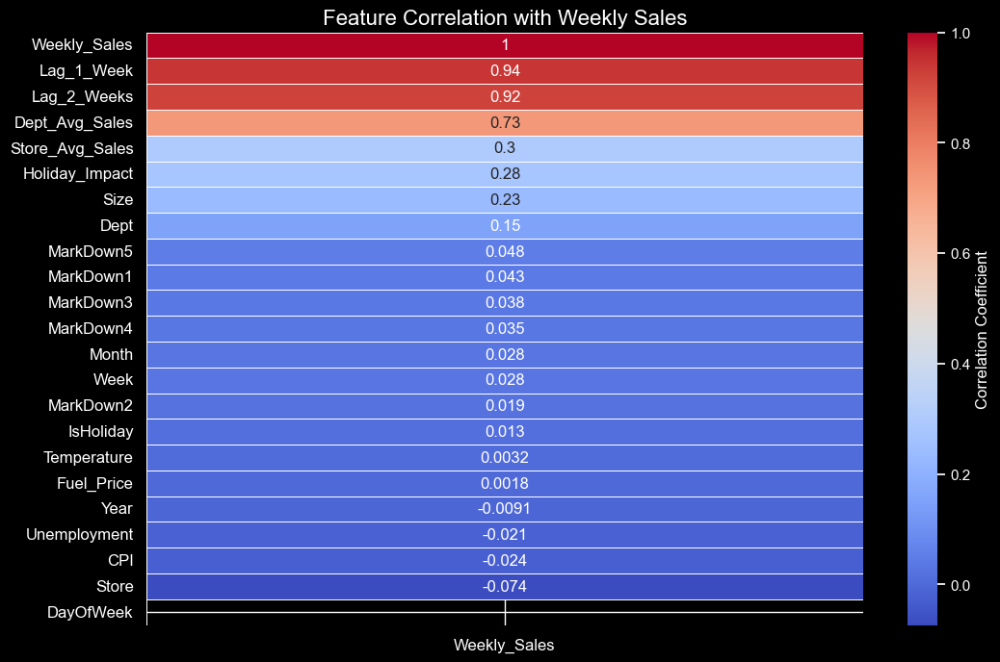

In [243]:
relevant_features = train_merged.select_dtypes(include=[np.number]).columns

correlation_matrix = train_merged[relevant_features].corr()

plt.figure(figsize=(12, 8), facecolor='black')
sns.heatmap(
    correlation_matrix[['Weekly_Sales']].sort_values(by='Weekly_Sales', ascending=False),
    annot=True,
    cmap='coolwarm',
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Feature Correlation with Weekly Sales', color='white', fontsize=16)
plt.xticks(color='white', fontsize=12)
plt.yticks(color='white', fontsize=12)
plt.show()


## Optimize the Model

## create a treshold and use just weekly sales >= $50

In [319]:
train_merged = train_merged[train_merged['Weekly_Sales'] >= 50]

## Adding Lag and Rolling7_day_avg

In [321]:
train_merged = train_merged.sort_values(['Store', 'Dept', 'Date'])
train_merged['Lag_1_Week'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(1)
train_merged['Lag_2_Weeks'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(2)
train_merged['Lag_3_Weeks'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(3)

train_merged['Rolling_7_day_avg'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].transform(lambda x: x.rolling(7, min_periods=1).mean())
train_merged['IsHoliday'] = train_merged['IsHoliday'].astype(int)
train_merged['Holiday_Impact'] = train_merged['IsHoliday'] * train_merged['Weekly_Sales']

train_merged['Lag_1_Week'] = train_merged['Lag_1_Week'].fillna(0)
train_merged['Lag_2_Weeks'] = train_merged['Lag_2_Weeks'].fillna(0)
train_merged['Lag_3_Weeks'] = train_merged['Lag_3_Weeks'].fillna(0)
train_merged['Rolling_7_day_avg'] = train_merged['Rolling_7_day_avg'].fillna(0)

## Markdown with missing values replace with 0

In [323]:
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
train_merged[markdown_columns] = train_merged[markdown_columns].fillna(0)

## Outlier detection and removal using IQR for 'Weekly_Sales'

In [325]:
Q1 = train_merged['Weekly_Sales'].quantile(0.25)
Q3 = train_merged['Weekly_Sales'].quantile(0.75)
IQR = Q3 - Q1

In [327]:
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

## Remove outliers

In [329]:
train_merged = train_merged[(train_merged['Weekly_Sales'] >= lower_bound) & (train_merged['Weekly_Sales'] <= upper_bound)]

In [331]:
X = train_merged.drop(columns=['Weekly_Sales', 'Date'])
y = train_merged['Weekly_Sales']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [333]:
X_cat = X_train.select_dtypes(exclude='number').columns
X_num = X_train.select_dtypes(include='number').columns

preprocessor = make_column_transformer(
    (OrdinalEncoder(), X_cat),
    (SimpleImputer(strategy='mean'), X_num),
    remainder="passthrough"
)


X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

In [336]:
xgb_model1 = xgb.XGBRegressor(
    n_estimators=5000,
    learning_rate=0.05,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='mae',
    early_stopping_rounds=200
)

xgb_model.fit(
    X_train_transformed, y_train,
    eval_set=[(X_train_transformed, y_train), (X_test_transformed, y_test)],
    verbose=1000
)


y_train_pred = xgb_model.predict(X_train_transformed)
y_test_pred = xgb_model.predict(X_test_transformed)

[0]	validation_0-mae:8756.54542	validation_1-mae:8794.54611
[1000]	validation_0-mae:621.66270	validation_1-mae:795.52308
[2000]	validation_0-mae:488.25094	validation_1-mae:754.60009
[3000]	validation_0-mae:403.81104	validation_1-mae:737.99088
[4000]	validation_0-mae:342.81661	validation_1-mae:729.92203
[4999]	validation_0-mae:295.29057	validation_1-mae:724.81311


## Discourage negative predictions by setting them to 0

In [337]:
y_train_pred = np.maximum(y_train_pred, 0)
y_test_pred = np.maximum(y_test_pred, 0)

In [340]:
def calculate_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_mask = y_true != 0  # Avoid division by zero
    return np.mean(np.abs((y_true[non_zero_mask] - y_pred[non_zero_mask]) / y_true[non_zero_mask])) * 100

rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
mape_train = calculate_mape(y_train, y_train_pred)

rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mape_test = calculate_mape(y_test, y_test_pred)

print("\n--- Training Metrics ---")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train MAE: {mae_train:.4f}")
print(f"Train R²: {r2_train:.4f}")
print(f"Train MAPE: {mape_train:.2f}%")

print("\n--- Testing Metrics ---")
print(f"Test RMSE: {rmse_test:.4f}")
print(f"Test MAE: {mae_test:.4f}")
print(f"Test R²: {r2_test:.4f}")
print(f"Test MAPE: {mape_test:.2f}%")



--- Training Metrics ---
Train RMSE: 425.9868
Train MAE: 294.9901
Train R²: 0.9987
Train MAPE: 10.71%

--- Testing Metrics ---
Test RMSE: 1279.2549
Test MAE: 724.2645
Test R²: 0.9880
Test MAPE: 15.96%


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [342]:
categorical_columns = train_merged.select_dtypes(exclude=[np.number]).columns
encoder = OneHotEncoder(drop='first', sparse_output=False)

encoded_categorical = encoder.fit_transform(train_merged[categorical_columns])

encoded_df = pd.DataFrame(encoded_categorical, columns=encoder.get_feature_names_out(categorical_columns))
train_merged = train_merged.join(encoded_df)

train_merged = train_merged.drop(columns=categorical_columns)

correlation_matrix = train_merged.corr()

correlation_with_target = correlation_matrix['Weekly_Sales'].sort_values(ascending=False)

print("Top 10 most correlated features with Weekly_Sales (including encoded categorical features):")
print(correlation_with_target.head(15))

Top 10 most correlated features with Weekly_Sales (including encoded categorical features):
Weekly_Sales         1.000000
Rolling_7_day_avg    0.951759
Lag_1_Week           0.936657
Lag_2_Weeks          0.896274
Lag_3_Weeks          0.874508
Dept_Avg_Sales       0.647682
Store_Avg_Sales      0.225520
Size                 0.200826
Holiday_Impact       0.198979
MarkDown5            0.035500
MarkDown1            0.034332
MarkDown4            0.024778
Month                0.022837
Week                 0.022478
Type_B               0.018399
Name: Weekly_Sales, dtype: float64


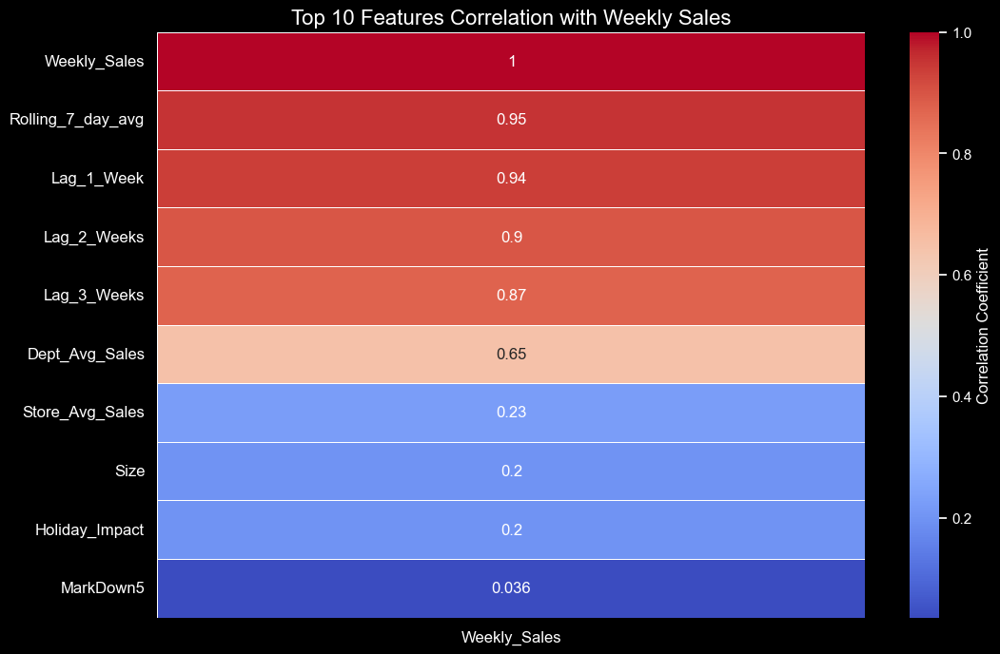

In [344]:
relevant_features = train_merged.select_dtypes(include=[np.number]).columns

correlation_matrix = train_merged[relevant_features].corr()

top_10_features = correlation_matrix['Weekly_Sales'].sort_values(ascending=False).head(10).index

plt.figure(figsize=(12, 8), facecolor='black')
sns.heatmap(
    correlation_matrix.loc[top_10_features, ['Weekly_Sales']],
    annot=True,
    cmap='coolwarm',
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Top 10 Features Correlation with Weekly Sales', color='white', fontsize=16)
plt.xticks(color='white', fontsize=12)
plt.yticks(color='white', fontsize=12)
plt.show()



## Top 10 most correlated features

## Define features and target

In [350]:
X = train_merged[['Rolling_7_day_avg', 'Lag_1_Week', 'Lag_2_Weeks', 'Lag_3_Weeks', 'Dept_Avg_Sales', 'Store_Avg_Sales', 'Size', 'Holiday_Impact', 'MarkDown5']]
y = train_merged['Weekly_Sales']


In [352]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_cat = X_train.select_dtypes(exclude='number').columns
X_num = X_train.select_dtypes(include='number').columns

preprocessor = make_column_transformer(
    (OrdinalEncoder(), X_cat),
    (SimpleImputer(strategy='mean'), X_num),
    remainder="passthrough"
)

X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

In [354]:
xgb_model2 = xgb.XGBRegressor(
    n_estimators=5000,
    learning_rate=0.05,
    max_depth=8,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric='mae',
    early_stopping_rounds=200
)

xgb_model.fit(
    X_train_transformed, y_train,
    eval_set=[(X_train_transformed, y_train), (X_test_transformed, y_test)],
    verbose=1000
)

y_train_pred = xgb_model.predict(X_train_transformed)
y_test_pred = xgb_model.predict(X_test_transformed)

[0]	validation_0-mae:8756.61424	validation_1-mae:8794.30251
[1000]	validation_0-mae:808.84887	validation_1-mae:995.21604
[2000]	validation_0-mae:688.49123	validation_1-mae:988.33559
[2142]	validation_0-mae:675.21079	validation_1-mae:988.28465


In [356]:
def calculate_mape(y_true, y_pred):
    y_pred = np.maximum(y_pred, 0)  # Ensure predictions are non-negative
    mask = y_true != 0  # Avoid division by zero
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

y_train_pred = np.maximum(y_train_pred, 0)
y_test_pred = np.maximum(y_test_pred, 0)

rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
mape_train = calculate_mape(y_train.values, y_train_pred)

rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mape_test = calculate_mape(y_test.values, y_test_pred)

print("\n--- Training Metrics ---")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train MAE: {mae_train:.4f}")
print(f"Train R²: {r2_train:.4f}")
print(f"Train MAPE: {mape_train:.2f}%")

print("\n--- Testing Metrics ---")
print(f"Test RMSE: {rmse_test:.4f}")
print(f"Test MAE: {mae_test:.4f}")
print(f"Test R²: {r2_test:.4f}")
print(f"Test MAPE: {mape_test:.2f}%")



--- Training Metrics ---
Train RMSE: 1124.8128
Train MAE: 694.3268
Train R²: 0.9906
Train MAPE: 15.07%

--- Testing Metrics ---
Test RMSE: 1790.6000
Test MAE: 988.0407
Test R²: 0.9765
Test MAPE: 17.51%


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



## Tuned XGB - Final Model

In [362]:
train_merged = train_merged[train_merged['Weekly_Sales'] >= 0]
for col in markdown_columns:
    train_merged[col] = train_merged[col].apply(lambda x: max(x, 0))

train_merged['Date'] = pd.to_datetime(train_merged['Date'])
train_merged['Year'] = train_merged['Date'].dt.year
train_merged['Month'] = train_merged['Date'].dt.month
train_merged['Week'] = train_merged['Date'].dt.isocalendar().week
train_merged['DayOfWeek'] = train_merged['Date'].dt.dayofweek
train_merged['Holiday_Impact'] = train_merged['IsHoliday'] * train_merged['Weekly_Sales']
train_merged['Store_Avg_Sales'] = train_merged.groupby('Store')['Weekly_Sales'].transform('mean')
train_merged['Dept_Avg_Sales'] = train_merged.groupby('Dept')['Weekly_Sales'].transform('mean')
train_merged['Lag_1_Week'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(1).fillna(0)
train_merged['Lag_2_Weeks'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(2).fillna(0)
train_merged['Lag_3_Weeks'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(3).fillna(0)
train_merged['Lag_4_Weeks'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(4).fillna(0)
train_merged['Rolling_7_day_avg'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].transform(
    lambda x: x.rolling(7, min_periods=1).mean()).fillna(0)
train_merged['Rolling_30_day_avg'] = train_merged.groupby(['Store', 'Dept'])['Weekly_Sales'].transform(
    lambda x: x.rolling(30, min_periods=1).mean()).fillna(0)
train_merged['Week_Sin'] = np.sin(2 * np.pi * train_merged['Week'] / 52)
train_merged['Week_Cos'] = np.cos(2 * np.pi * train_merged['Week'] / 52)
train_merged['Sales_Per_Sqft'] = train_merged['Weekly_Sales'] / train_merged['Size']

Q1 = train_merged['Weekly_Sales'].quantile(0.25)
Q3 = train_merged['Weekly_Sales'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
train_merged = train_merged[(train_merged['Weekly_Sales'] >= lower_bound) & (train_merged['Weekly_Sales'] <= upper_bound)]

X = train_merged[['Rolling_7_day_avg', 'Lag_1_Week', 'Lag_2_Weeks', 'Lag_3_Weeks', 
                  'Dept_Avg_Sales', 'Store_Avg_Sales', 'Size', 'Holiday_Impact', 
                  'MarkDown5', 'Week_Sin', 'Week_Cos', 'Rolling_30_day_avg', 
                  'Sales_Per_Sqft', 'Lag_4_Weeks']]
y = train_merged['Weekly_Sales']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_cat = X_train.select_dtypes(exclude='number').columns
X_num = X_train.select_dtypes(include='number').columns
preprocessor = make_column_transformer(
    (OrdinalEncoder(), X_cat),
    (SimpleImputer(strategy='mean'), X_num),
    remainder="passthrough"
)

X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

# Train the model with best parameters
best_params = {
    'subsample': 0.6,
    'reg_lambda': 5,
    'reg_alpha': 0.1,
    'n_estimators': 3000,  
    'min_child_weight': 1,
    'max_depth': 8,  
    'learning_rate': 0.03,  
    'colsample_bytree': 0.8  
}

final_model = xgb.XGBRegressor(tree_method='hist', eval_metric='mae', random_state=42, **best_params)

final_model.fit(X_train_transformed, y_train)

def calculate_mape_with_threshold(y_true, y_pred, threshold=50):
    """
    Calculate Mean Absolute Percentage Error (MAPE) excluding actual values below a threshold.

    Parameters:
    - y_true: np.ndarray or pd.Series, actual target values
    - y_pred: np.ndarray or pd.Series, predicted values
    - threshold: float, exclude y_true values less than this threshold

    Returns:
    - MAPE: float, Mean Absolute Percentage Error in percentage
    """
    y_pred = np.maximum(y_pred, 0)  # Replace negative predictions with 0
    mask = y_true >= threshold  # Exclude values below the threshold
    percentage_errors = np.abs(y_true[mask] - y_pred[mask]) / y_true[mask]
    return np.mean(percentage_errors[np.isfinite(percentage_errors)]) * 100

y_train_pred = final_model.predict(X_train_transformed)
y_test_pred = final_model.predict(X_test_transformed)

y_train_pred = np.maximum(y_train_pred, 0)
y_test_pred = np.maximum(y_test_pred, 0)

rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
mape_train = calculate_mape_with_threshold(y_train.values, y_train_pred, threshold=50)

rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mape_test = calculate_mape_with_threshold(y_test.values, y_test_pred, threshold=50)

print("\n--- Final Training Metrics ---")
print(f"Train RMSE: {rmse_train:.4f}")
print(f"Train MAE: {mae_train:.4f}")
print(f"Train R²: {r2_train:.4f}")
print(f"Train MAPE (Threshold 50): {mape_train:.2f}%")

print("\n--- Final Testing Metrics ---")
print(f"Test RMSE: {rmse_test:.4f}")
print(f"Test MAE: {mae_test:.4f}")
print(f"Test R²: {r2_test:.4f}")
print(f"Test MAPE (Threshold 50): {mape_test:.2f}%")



--- Final Training Metrics ---
Train RMSE: 92.7902
Train MAE: 59.7462
Train R²: 0.9999
Train MAPE (Threshold 50): 1.48%

--- Final Testing Metrics ---
Test RMSE: 207.6565
Test MAE: 95.1318
Test R²: 0.9995
Test MAPE (Threshold 50): 1.80%


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



## Feature Correlation

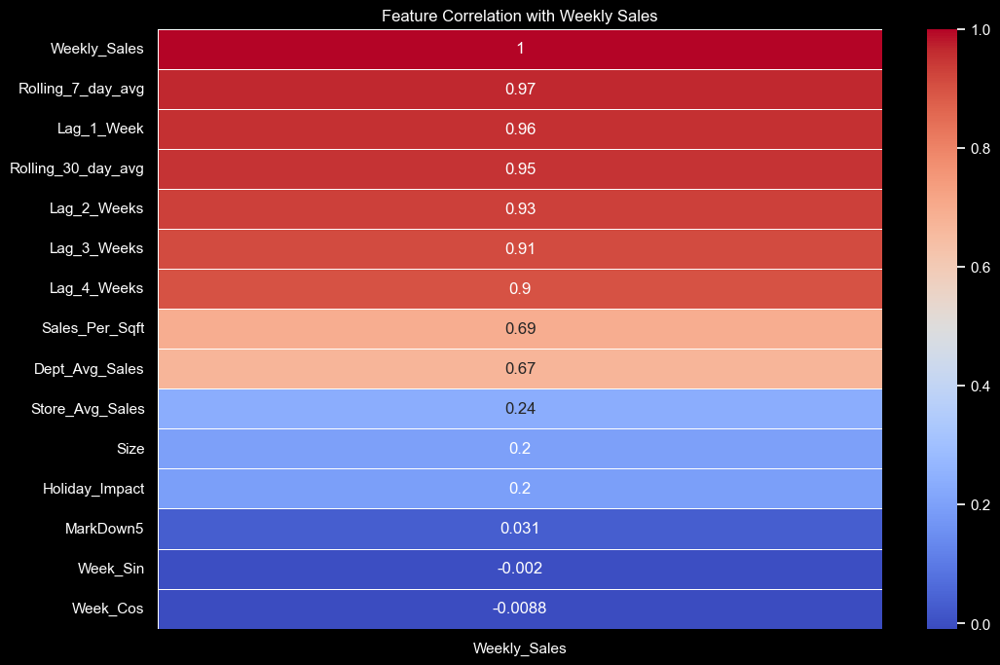

In [364]:
relevant_features = ['Rolling_7_day_avg', 'Lag_1_Week', 'Lag_2_Weeks', 'Lag_3_Weeks', 
                     'Dept_Avg_Sales', 'Store_Avg_Sales', 'Size', 'Holiday_Impact', 
                     'MarkDown5', 'Week_Sin', 'Week_Cos', 'Rolling_30_day_avg', 
                     'Sales_Per_Sqft', 'Lag_4_Weeks', 'Weekly_Sales']

correlation_matrix = train_merged[relevant_features].corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix[['Weekly_Sales']].sort_values(by='Weekly_Sales', ascending=False),
            annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Feature Correlation with Weekly Sales')
plt.show()


In [367]:
results_df = pd.DataFrame({
    'Actual_Sales': y_test.values,  # Convert y_test to values if it's a Series
    'Predicted_Sales': y_test_pred,
    'Difference': y_test.values - y_test_pred
})

results_df['Percentage_Error'] = np.abs(results_df['Difference']) / results_df['Actual_Sales'] * 100

results_df.head(20)

,Actual_Sales,Predicted_Sales,Difference,Percentage_Error
0,9364.94,9287.753906,77.186094,0.824203
1,1795.00,1735.572998,59.427002,3.310696
2,2051.06,2045.475708,5.584292,0.272264
3,1430.46,1412.627075,17.832925,1.246657
4,9402.70,9337.742188,64.957813,0.690842
5,9310.66,9290.372070,20.287930,0.217900
6,704.10,700.020508,4.079492,0.579391
7,80.86,70.039291,10.820709,13.382029
8,9601.99,9595.511719,6.478281,0.067468
9,2582.95,2555.535400,27.414600,1.061368


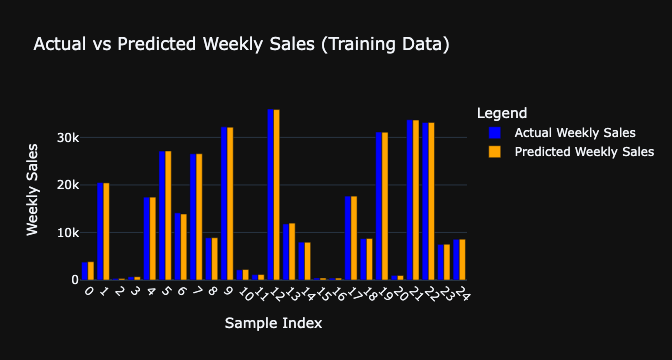

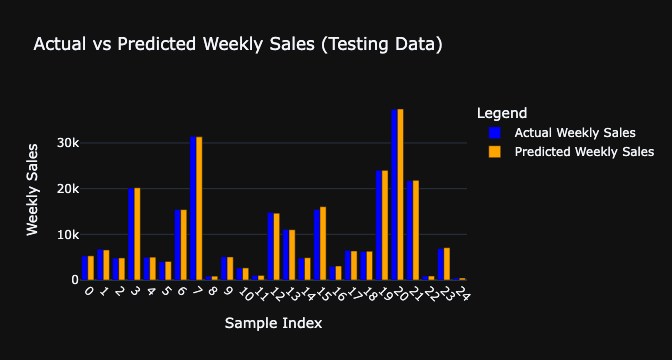

In [374]:
train_results_df = pd.DataFrame({
    'Actual_Weekly_Sales': y_train.values,
    'Predicted_Weekly_Sales': y_train_pred,
    'Difference': y_train.values - y_train_pred
})
train_results_df['Percentage_Error'] = np.abs(train_results_df['Difference']) / train_results_df['Actual_Weekly_Sales'] * 100

test_results_df = pd.DataFrame({
    'Actual_Weekly_Sales': y_test.values,
    'Predicted_Weekly_Sales': y_test_pred,
    'Difference': y_test.values - y_test_pred
})
test_results_df['Percentage_Error'] = np.abs(test_results_df['Difference']) / test_results_df['Actual_Weekly_Sales'] * 100

def plot_actual_vs_predicted_plotly(df, title):
    sample_df = df.sample(n=25, random_state=42).reset_index(drop=True)

    fig = go.Figure()

    fig.add_trace(go.Bar(
        x=sample_df.index,
        y=sample_df['Actual_Weekly_Sales'],
        name='Actual Weekly Sales',
        marker_color='blue'
    ))

    fig.add_trace(go.Bar(
        x=sample_df.index,
        y=sample_df['Predicted_Weekly_Sales'],
        name='Predicted Weekly Sales',
        marker_color='orange'
    ))

    fig.update_layout(
        title=title,
        xaxis_title="Sample Index",
        yaxis_title="Weekly Sales",
        legend_title="Legend",
        barmode='group',
        template='plotly_dark',
        xaxis=dict(tickmode='array', tickvals=sample_df.index, ticktext=sample_df.index, tickangle=45)
    )

    fig.show()

plot_actual_vs_predicted_plotly(train_results_df, 'Actual vs Predicted Weekly Sales (Training Data)')

plot_actual_vs_predicted_plotly(test_results_df, 'Actual vs Predicted Weekly Sales (Testing Data)')


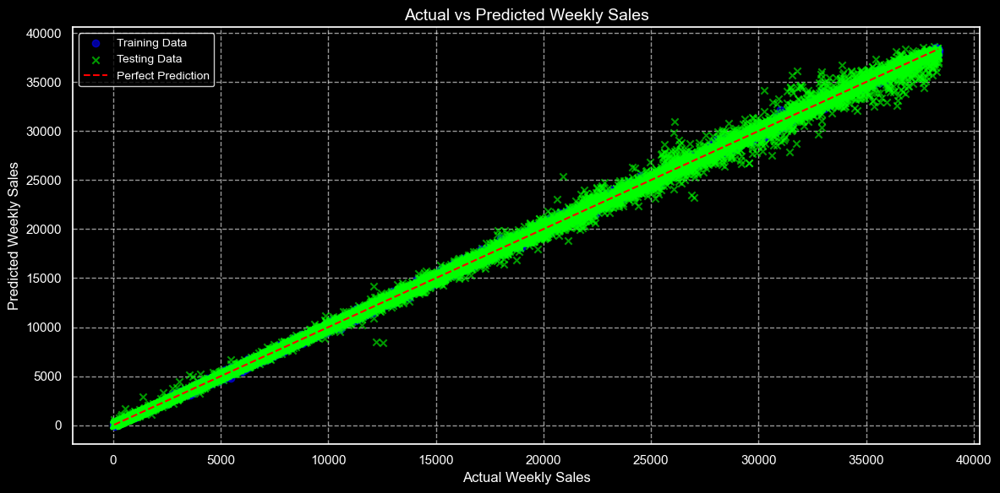

In [377]:
combined_actual = pd.concat([train_results_df["Actual_Weekly_Sales"], test_results_df["Actual_Weekly_Sales"]])
combined_predicted = pd.concat([train_results_df["Predicted_Weekly_Sales"], test_results_df["Predicted_Weekly_Sales"]])

min_val = combined_actual.min()
max_val = combined_actual.max()

plt.figure(figsize=(12, 6), facecolor="black")

plt.scatter(
    train_results_df["Actual_Weekly_Sales"],
    train_results_df["Predicted_Weekly_Sales"],
    alpha=0.6, label="Training Data", color="blue", marker='o'
)

plt.scatter(
    test_results_df["Actual_Weekly_Sales"],
    test_results_df["Predicted_Weekly_Sales"],
    alpha=0.6, label="Testing Data", color="lime", marker='x'
)

plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    color="red", linestyle="--", label="Perfect Prediction"
)

plt.title("Actual vs Predicted Weekly Sales", fontsize=14, color="white")
plt.xlabel("Actual Weekly Sales", fontsize=12, color="white")
plt.ylabel("Predicted Weekly Sales", fontsize=12, color="white")
plt.legend(facecolor="black", edgecolor="white", fontsize=10)
plt.grid(True, color="white", linestyle="--", alpha=0.6)
plt.xticks(color="white")
plt.yticks(color="white")
plt.tight_layout()
plt.show()


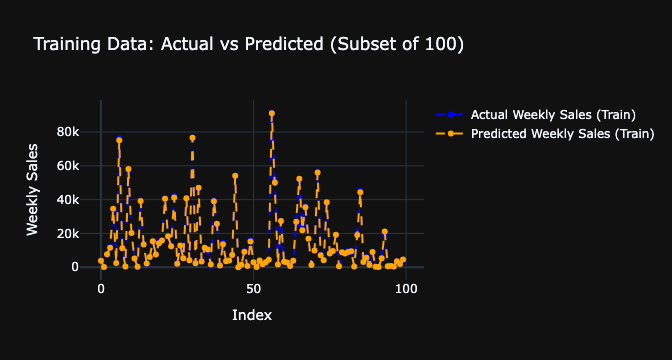

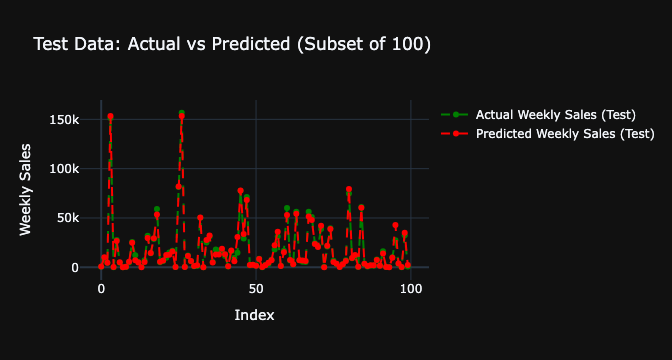

In [371]:
subset_train = train_results_df[:100]
subset_test = test_results_df[:100]

fig_train = go.Figure()

fig_train.add_trace(go.Scatter(
    x=subset_train.index,
    y=subset_train["Actual_Weekly_Sales"],
    mode='lines+markers',
    name="Actual Weekly Sales (Train)",
    line=dict(color='blue', dash='dash'),
    marker=dict(color='blue')
))

fig_train.add_trace(go.Scatter(
    x=subset_train.index,
    y=subset_train["Predicted_Weekly_Sales"],
    mode='lines+markers',
    name="Predicted Weekly Sales (Train)",
    line=dict(color='orange', dash='dash'),
    marker=dict(color='orange')
))

fig_train.update_layout(
    title="Training Data: Actual vs Predicted (Subset of 100)",
    xaxis_title="Index",
    yaxis_title="Weekly Sales",
    template="plotly_dark"
)

fig_train.show()

fig_test = go.Figure()

fig_test.add_trace(go.Scatter(
    x=subset_test.index,
    y=subset_test["Actual_Weekly_Sales"],
    mode='lines+markers',
    name="Actual Weekly Sales (Test)",
    line=dict(color='green', dash='dash'),
    marker=dict(color='green')
))

fig_test.add_trace(go.Scatter(
    x=subset_test.index,
    y=subset_test["Predicted_Weekly_Sales"],
    mode='lines+markers',
    name="Predicted Weekly Sales (Test)",
    line=dict(color='red', dash='dash'),
    marker=dict(color='red')
))

fig_test.update_layout(
    title="Test Data: Actual vs Predicted (Subset of 100)",
    xaxis_title="Index",
    yaxis_title="Weekly Sales",
    template="plotly_dark"
)

fig_test.show()
